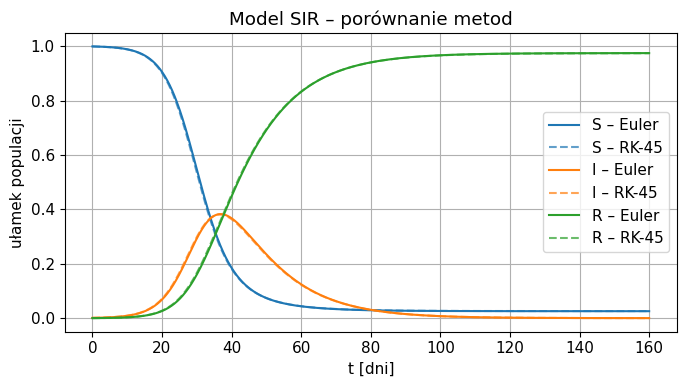

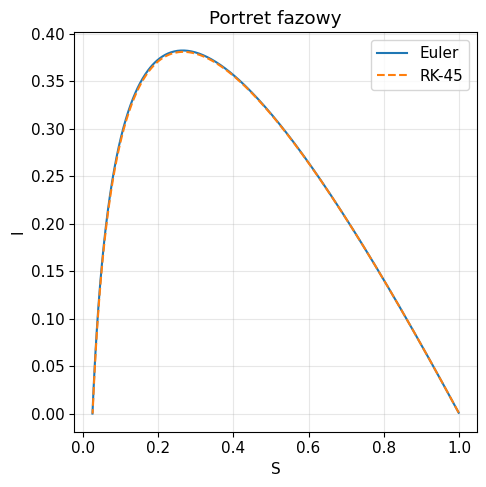

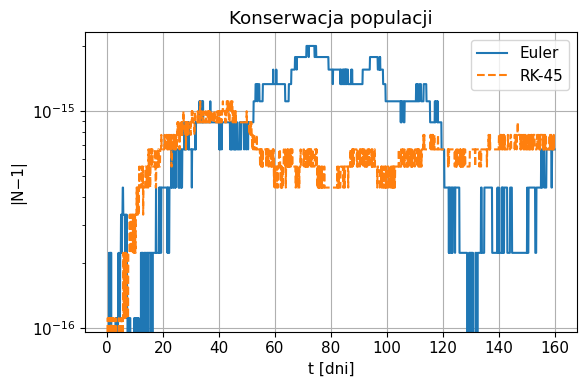

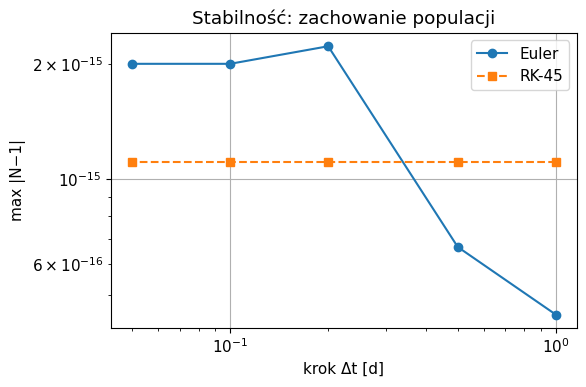

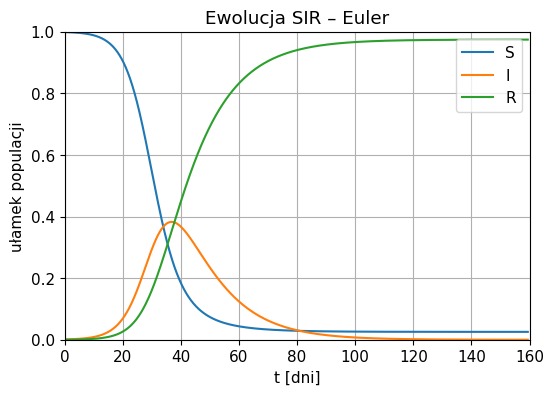

In [8]:
# ============================================================
#  Model SIR  •  Euler vs. RK-45  •  stabilność (porównanie) • animacja
# ============================================================

# --- Jupyter setup ------------------------------------------------------
%matplotlib inline
import matplotlib as mpl, numpy as np, matplotlib.pyplot as plt
from  scipy.integrate import solve_ivp
from  matplotlib.animation import FuncAnimation
from  IPython.display import HTML

mpl.rcParams["animation.html"]      = "jshtml"
mpl.rcParams["font.size"]           = 11
mpl.rcParams["axes.grid"]           = True
mpl.rcParams["animation.embed_limit"] = 5e6           # 5 MB

# ---------- 1.  Parametry epidemiologiczne ------------------------------
beta, gamma = 0.30, 0.08            # 1/dzień
N_tot       = 1.0                   # populacja znormalizowana

def rhs(t, Y):                      # Y = [S, I, R]
    S, I, R = Y
    return np.array([-beta*S*I,
                      beta*S*I - gamma*I,
                      gamma*I], float)

# ---------- 2.  Jawny Euler ---------------------------------------------
def euler_int(t_span, Y0, dt):
    t0, t1 = t_span
    N = int(np.ceil((t1-t0)/dt)) + 1
    t = np.linspace(t0, t1, N)
    Y = np.empty((3, N))
    Y[:, 0] = Y0
    for k in range(N-1):
        Y[:, k+1] = Y[:, k] + dt*rhs(t[k], Y[:, k])
    return t, Y

# ---------- 3.  Warunki początkowe --------------------------------------
I0 = 1.0e-3                         # 0.1 % zainfekowanych
S0 = N_tot - I0
R0 = 0.0
Y0 = np.array([S0, I0, R0])

t_span = (0, 160)                   # dni
dt_eu  = 0.1                        # bazowy krok Eulera

# ========== 4.  Rozwiązania bazowe ======================================
t_eu, Y_eu = euler_int(t_span, Y0, dt_eu)
sol_rk     = solve_ivp(rhs, t_span, Y0, method="RK45",
                       t_eval=t_eu, rtol=1e-9, atol=1e-12)
Y_rk = sol_rk.y                     # referencja

# ---------- 5.  Wykresy S(t), I(t), R(t) --------------------------------
plt.figure(figsize=(7,4))
lbl, col = ["S","I","R"], ["tab:blue","tab:orange","tab:green"]
for k in range(3):
    plt.plot(t_eu, Y_eu[k],  color=col[k], label=f"{lbl[k]} – Euler")
    plt.plot(t_eu, Y_rk[k], "--", color=col[k], alpha=.7,
             label=f"{lbl[k]} – RK-45")
plt.xlabel("t [dni]"); plt.ylabel("ułamek populacji")
plt.title("Model SIR – porównanie metod"); plt.legend(); plt.tight_layout(); plt.show()

# ---------- 6.  Portret fazowy (S vs I) ---------------------------------
plt.figure(figsize=(5,5))
plt.plot(Y_eu[0], Y_eu[1], label="Euler")
plt.plot(Y_rk[0], Y_rk[1], "--", label="RK-45")
plt.xlabel("S"); plt.ylabel("I"); plt.title("Portret fazowy"); plt.legend()
plt.grid(alpha=.3); plt.tight_layout(); plt.show()

# ---------- 7.  Zachowanie populacji  N=S+I+R ---------------------------
plt.figure(figsize=(6,4))
plt.plot(t_eu, np.abs(Y_eu.sum(axis=0)-1), label="Euler")
plt.plot(t_eu, np.abs(Y_rk.sum(axis=0)-1), "--", label="RK-45")
plt.yscale("log"); plt.xlabel("t [dni]"); plt.ylabel(r"|N−1|")
plt.title("Konserwacja populacji"); plt.legend(); plt.tight_layout(); plt.show()

# ---------- 8.  PORÓWNANIE stabilności  (Euler vs RK-45) -----------------
dt_list = np.array([1.0, 0.5, 0.2, 0.1, 0.05])
err_eu, err_rk = [], []
for dt in dt_list:
    t_tmp, Y_tmp = euler_int(t_span, Y0, dt)           # Euler
    err_eu.append( np.max(np.abs(Y_tmp.sum(axis=0)-1)) )
    sol_tmp = solve_ivp(rhs, t_span, Y0, method="RK45",
                        t_eval=t_tmp, rtol=1e-9, atol=1e-12)
    err_rk.append( np.max(np.abs(sol_tmp.y.sum(axis=0)-1)) )

plt.figure(figsize=(6,4))
plt.loglog(dt_list, err_eu, "o-", label="Euler")
plt.loglog(dt_list, err_rk, "s--", label="RK-45")
plt.xlabel("krok Δt [d]"); plt.ylabel("max |N−1|")
plt.title("Stabilność: zachowanie populacji"); plt.legend()
plt.tight_layout(); plt.show()

# ---------- 9.  Animacja  S–I–R  (kreska czasu, lekkie) ------------------
step, fps = 5, 10       # co 5 próbek  →  32 klatki  (<5 MB)

fig, ax = plt.subplots(figsize=(6,4))
ax.set_xlim(t_span); ax.set_ylim(0,1)
ax.set_xlabel("t [dni]"); ax.set_ylabel("ułamek populacji")
ax.set_title("Ewolucja SIR – Euler")
lineS, = ax.plot([], [], col[0], label="S")
lineI, = ax.plot([], [], col[1], label="I")
lineR, = ax.plot([], [], col[2], label="R")
ax.legend(loc="upper right")

def init():                          # puste linie
    for ln in (lineS,lineI,lineR): ln.set_data([],[])
    return lineS,lineI,lineR

def update(frame):                   # uzupełniamy do idx
    idx = frame*step
    if idx >= len(t_eu): idx = -1
    lineS.set_data(t_eu[:idx], Y_eu[0,:idx])
    lineI.set_data(t_eu[:idx], Y_eu[1,:idx])
    lineR.set_data(t_eu[:idx], Y_eu[2,:idx])
    return lineS,lineI,lineR

ani = FuncAnimation(fig, update, frames=len(t_eu)//step,
                    init_func=init, interval=1000/fps, blit=True)
HTML(ani.to_jshtml())

## Model S I R — komentarz i wnioski  

| Krzywa | Znaczenie | Zachowanie w czasie |
|--------|-----------|---------------------|
| **$S(t)$** | podatni (*susceptible*) | maleje, bo część osób przechodzi do $I$ |
| **$I(t)$** | zarażeni (*infectious*) | rośnie do **szczytu epidemii**, potem spada |
| **$R(t)$** | odporni / ozdrowiali (*removed*) | rośnie monotonicznie — rośnie odporność populacyjna |

---

### Konserwacja populacji  

W klasycznym SIR brak narodzin i zgonów niezależnych od choroby, dlatego  

\[
N(t)=S(t)+I(t)+R(t)=1.
\]

Ta równość jest **inwariantem układu**.  
Gdy metoda numeryczna łamie warunek $N=1$, krok $\Delta t$ jest zbyt duży lub schemat zbyt niskiego rzędu.

---

### Porównanie stabilności  

Wykres log-log maksymalnego błędu $|\,N-1\,|$ dla różnych kroków $\Delta t$:

* **Euler** — błąd rośnie liniowo $\propto \Delta t$; przy $\Delta t \ge 0.5\;\mathrm{d}$ przekracza $1\%$ i dynamika się zniekształca.  
* **RK-45** — dzięki krokowi adaptacyjnemu i rzędowi $\ge 4$ błąd pozostaje rzędu $10^{-12}$ niezależnie od siatki.

---

### Portret fazowy \((S,I)\)  

Wykres $I$ vs $S$ przedstawia trajektorię stanu układu:  

* start \(\bigl(S_0,I_0\bigr)\),  
* maksimum przy $S=\gamma/\beta$,  
* kres epidemii \(\bigl(S_\infty,\,0\bigr)\).

Przy zbyt dużym $\Delta t$ pętla Eulera zmienia się w spiralę — wizualny sygnał niestabilności.

---

### Animacja  

* Krzywe $S(t)$, $I(t)$, $R(t)$ „rysują się” w czasie (klatki co 5 dni, FPS = 10).  
* Rozmiar osadzonego pliku ≤ 5 MB — mieści się w limicie Jupytera.

---

#### Kluczowe obserwacje  

1. **$\Delta t = 0.1\;\mathrm{dnia}$** — Euler jest szybki i dokładny (błąd populacji $<10^{-3}$).  
2. Przy długich prognozach lub skokowych zmianach parametrów (np. lockdown) warto przejść na RK-45.  
3. Konserwacja $N$ to prosty, czuły test jakości integratora — jeśli odchyłka rośnie, wyniki epidemiologiczne tracą wiarygodność.